In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns


In [2]:
folderName = "Human/Combined/"
#folderName = "MrRVsStaticObstacles/"
fileNameEasy = "Easy.json"
fileNameMid = "Mid.json"
fileNameHard = "Hard.json"

jsonFileEasy = folderName + fileNameEasy
jsonFileMid = folderName + fileNameMid
jsonFileHard = folderName + fileNameHard

dataEasy = pd.read_json(jsonFileEasy)
dataMid = pd.read_json(jsonFileMid)
dataHard = pd.read_json(jsonFileHard)

In [3]:
dataEasy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   epNo                   24 non-null     int64  
 1   timesteps              24 non-null     int64  
 2   time                   24 non-null     float64
 3   wallHit                24 non-null     int64  
 4   collidedWith           24 non-null     object 
 5   distanceCovered        24 non-null     float64
 6   maxSpeed               24 non-null     float64
 7   avgSpeed               24 non-null     float64
 8   totalReward            24 non-null     float64
 9   rewardFromCheckpoints  24 non-null     float64
 10  rewardFromFinish       24 non-null     int64  
 11  rewardFromTimeRunOut   24 non-null     int64  
 12  rewardFromWall         24 non-null     int64  
 13  rewardFromSpeed        24 non-null     float64
 14  rewardFromTime         24 non-null     float64
 15  rewardFr

In [4]:
dataMid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   epNo                   24 non-null     int64  
 1   timesteps              24 non-null     int64  
 2   time                   24 non-null     float64
 3   wallHit                24 non-null     int64  
 4   collidedWith           24 non-null     object 
 5   distanceCovered        24 non-null     float64
 6   maxSpeed               24 non-null     float64
 7   avgSpeed               24 non-null     float64
 8   totalReward            24 non-null     float64
 9   rewardFromCheckpoints  24 non-null     float64
 10  rewardFromFinish       24 non-null     int64  
 11  rewardFromTimeRunOut   24 non-null     int64  
 12  rewardFromWall         24 non-null     int64  
 13  rewardFromSpeed        24 non-null     float64
 14  rewardFromTime         24 non-null     float64
 15  rewardFr

In [5]:
dataHard.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   epNo                   24 non-null     int64  
 1   timesteps              24 non-null     int64  
 2   time                   24 non-null     float64
 3   wallHit                24 non-null     int64  
 4   collidedWith           24 non-null     object 
 5   distanceCovered        24 non-null     float64
 6   maxSpeed               24 non-null     float64
 7   avgSpeed               24 non-null     float64
 8   totalReward            24 non-null     float64
 9   rewardFromCheckpoints  24 non-null     int64  
 10  rewardFromFinish       24 non-null     int64  
 11  rewardFromTimeRunOut   24 non-null     int64  
 12  rewardFromWall         24 non-null     int64  
 13  rewardFromSpeed        24 non-null     float64
 14  rewardFromTime         24 non-null     float64
 15  rewardFr

In [6]:
df = dataEasy

dfIndex = df.index
print(dfIndex)
zerosRows = df["timesteps"] == 0
zerosRows = dfIndex[zerosRows]
zeroesIndices = zerosRows.tolist()
zeroesIndices

RangeIndex(start=0, stop=24, step=1)


[0]

In [7]:
df = dataEasy

dfIndex = df.index
print(dfIndex)
zerosRows = df["timesteps"] == 0
zerosRows = dfIndex[zerosRows]
zeroesIndices = zerosRows.tolist()

for i in zeroesIndices:
    df.loc[df['epNo'] > i, 'epNo'] -= 1

dfIndex = df.index
df = df[df["timesteps"] != 0]
df['epNo'] = np.arange(df.shape[0])
dataEasy = df
dataEasy

RangeIndex(start=0, stop=24, step=1)
<ipython-input-7-f58f51198d0e>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['epNo'] = np.arange(df.shape[0])


,epNo,timesteps,time,wallHit,collidedWith,distanceCovered,maxSpeed,avgSpeed,totalReward,rewardFromCheckpoints,rewardFromFinish,rewardFromTimeRunOut,rewardFromWall,rewardFromSpeed,rewardFromTime,rewardFromBrakes
1,0,1058,21.148632,1,ModularTrackCurveLarge (9),119.801659,8.831210,5.710323,30.104855,46.153847,0,0,-13,-1.989998,-1.058993,0
2,1,1812,36.235577,0,,279.392517,10.554854,7.737909,139.424652,92.307686,50,0,0,-1.069999,-1.813029,0
3,2,1674,33.469040,0,,277.469238,10.586226,8.316498,139.522659,92.307686,50,0,0,-1.109999,-1.675022,0
4,3,2087,41.736850,0,,287.342346,10.047564,6.907848,136.089661,92.307686,50,0,0,-4.130000,-2.088031,0
5,4,818,16.335903,1,obstacle (4),80.455696,7.369064,4.968917,15.120240,30.769232,0,0,-13,-1.829999,-0.818993,0
6,5,200,4.000000,1,obstacle (3),0.000000,0.000000,3.000000,-13.200000,0.000000,0,0,-13,0.000000,0.000000,0
7,6,388,7.767413,1,ModularTrackCurveLarge (12),35.356037,7.641337,4.664309,0.535617,15.384615,0,0,-13,-1.459999,-0.388999,0
8,7,375,7.500413,1,ModularTrackCurveLarge (12),39.136074,8.173761,5.315992,0.888617,15.384615,0,0,-13,-1.119999,-0.375999,0
9,8,1870,37.398360,0,,281.235718,11.226145,7.547949,138.056656,92.307686,50,0,0,-2.379998,-1.871031,0
10,9,1666,33.289810,0,,284.797546,11.590926,8.577051,139.570663,92.307686,50,0,0,-1.069999,-1.667022,0


In [8]:
df = dataMid

dfIndex = df.index
print(dfIndex)
zerosRows = df["timesteps"] == 0
zerosRows = dfIndex[zerosRows]
zeroesIndices = zerosRows.tolist()

for i in zeroesIndices:
    df.loc[df['epNo'] > i, 'epNo'] -= 1

dfIndex = df.index
df = df[df["timesteps"] != 0]
df['epNo'] = np.arange(df.shape[0])
dataMid = df
dataMid

RangeIndex(start=0, stop=24, step=1)
<ipython-input-8-48ae3cc80bda>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['epNo'] = np.arange(df.shape[0])


,epNo,timesteps,time,wallHit,collidedWith,distanceCovered,maxSpeed,avgSpeed,totalReward,rewardFromCheckpoints,rewardFromFinish,rewardFromTimeRunOut,rewardFromWall,rewardFromSpeed,rewardFromTime,rewardFromBrakes
1,0,2786,55.715120,0,,403.441589,10.650487,7.261291,139.573013,93.75,50,0,0,-1.389999,-2.786980,0.000000
2,1,2724,54.470776,0,,399.659027,9.885859,7.357441,139.965012,93.75,50,0,0,-1.059999,-2.724985,0.000000
3,2,1765,35.302260,1,Wall,269.922241,11.768565,7.670900,46.693973,62.50,0,0,-13,-1.039999,-1.766026,0.000000
4,3,1799,35.968758,1,Wall,269.517456,11.996952,7.516193,46.509970,62.50,0,0,-13,-1.189999,-1.800028,0.000000
5,4,1961,39.213154,1,Wall,230.670303,9.850410,5.903203,19.987928,56.25,0,0,-13,-4.500008,-1.962036,-16.800028
6,5,1831,36.603203,1,Wall,272.356628,11.055173,7.462791,46.177970,62.50,0,0,-13,-1.489999,-1.832030,0.000000
7,6,3044,60.871895,0,,424.842224,10.613501,6.995872,138.985046,93.75,50,0,0,-1.719999,-3.044962,0.000000
8,7,3024,60.505380,0,,421.230164,11.040750,6.982044,138.205032,93.75,50,0,0,-2.519998,-3.024963,0.000000
9,8,2762,55.224613,0,,410.841797,11.638104,7.456687,137.917023,93.75,50,0,0,-2.669998,-2.762982,-0.400000
10,9,2559,51.194694,0,,411.841675,11.746943,8.068342,138.440000,93.75,50,0,0,-1.149999,-2.559997,-1.600000


In [9]:
df = dataHard

dfIndex = df.index
print(dfIndex)
zerosRows = df["timesteps"] == 0
zerosRows = dfIndex[zerosRows]
zeroesIndices = zerosRows.tolist()

for i in zeroesIndices:
    df.loc[df['epNo'] > i, 'epNo'] -= 1

dfIndex = df.index
df = df[df["timesteps"] != 0]
df['epNo'] = np.arange(df.shape[0])
dataHard = df
dataHard

RangeIndex(start=0, stop=24, step=1)
<ipython-input-9-9f6fc393f312>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['epNo'] = np.arange(df.shape[0])


,epNo,timesteps,time,wallHit,collidedWith,distanceCovered,maxSpeed,avgSpeed,totalReward,rewardFromCheckpoints,rewardFromFinish,rewardFromTimeRunOut,rewardFromWall,rewardFromSpeed,rewardFromTime,rewardFromBrakes
1,0,554,11.072217,1,Wall,43.766388,6.403069,4.023186,-5.164995,10,0,0,-13,-1.609999,-0.554996,0.000000
2,1,2812,56.237390,1,Wall,348.134949,9.274868,6.213978,62.947020,80,0,0,-13,-1.239999,-2.812979,0.000000
3,2,3061,61.204308,0,,396.992889,10.657447,6.507891,140.608047,95,50,0,0,-1.329999,-3.061960,0.000000
4,3,1470,29.401380,1,Wall,188.614273,10.157391,6.445101,24.448988,40,0,0,-13,-1.079999,-1.471013,0.000000
5,4,3801,76.014275,0,,419.829956,9.189002,5.536956,116.127953,95,50,0,0,-9.270117,-3.801907,-15.800024
6,5,3836,76.707130,0,,424.658752,9.529121,5.554717,110.232941,95,50,0,0,-8.930109,-3.836904,-22.000048
7,6,1763,35.269493,1,Wall,199.091965,8.417569,5.675492,21.955978,45,0,0,-13,-2.979998,-1.764026,-5.299997
8,7,3168,63.338830,0,,410.493225,9.820313,6.498572,132.951050,95,50,0,0,-2.979998,-3.168953,-5.899997
9,8,3105,62.082645,0,,407.863892,11.456364,6.586280,136.014038,95,50,0,0,-4.380005,-3.105957,-1.500000
10,9,2917,58.357384,0,,410.685669,10.082673,7.059330,139.132034,95,50,0,0,-1.949998,-2.917971,-1.000000


In [10]:
#dataEasy = dataEasy[dataEasy["timesteps"] != 0]
#dataMid = dataMid[dataMid["timesteps"] != 0]
#dataHard = dataHard[dataHard["timesteps"] != 0]

In [11]:
extraRows = list(range(101, dataHard.shape[0]+1))

dataHard = dataHard.drop(extraRows)
#dataHard['epNo']-=1
#dataHard.head()
#dataHard.info()
dataHard

,epNo,timesteps,time,wallHit,collidedWith,distanceCovered,maxSpeed,avgSpeed,totalReward,rewardFromCheckpoints,rewardFromFinish,rewardFromTimeRunOut,rewardFromWall,rewardFromSpeed,rewardFromTime,rewardFromBrakes
1,0,554,11.072217,1,Wall,43.766388,6.403069,4.023186,-5.164995,10,0,0,-13,-1.609999,-0.554996,0.000000
2,1,2812,56.237390,1,Wall,348.134949,9.274868,6.213978,62.947020,80,0,0,-13,-1.239999,-2.812979,0.000000
3,2,3061,61.204308,0,,396.992889,10.657447,6.507891,140.608047,95,50,0,0,-1.329999,-3.061960,0.000000
4,3,1470,29.401380,1,Wall,188.614273,10.157391,6.445101,24.448988,40,0,0,-13,-1.079999,-1.471013,0.000000
5,4,3801,76.014275,0,,419.829956,9.189002,5.536956,116.127953,95,50,0,0,-9.270117,-3.801907,-15.800024
6,5,3836,76.707130,0,,424.658752,9.529121,5.554717,110.232941,95,50,0,0,-8.930109,-3.836904,-22.000048
7,6,1763,35.269493,1,Wall,199.091965,8.417569,5.675492,21.955978,45,0,0,-13,-2.979998,-1.764026,-5.299997
8,7,3168,63.338830,0,,410.493225,9.820313,6.498572,132.951050,95,50,0,0,-2.979998,-3.168953,-5.899997
9,8,3105,62.082645,0,,407.863892,11.456364,6.586280,136.014038,95,50,0,0,-4.380005,-3.105957,-1.500000
10,9,2917,58.357384,0,,410.685669,10.082673,7.059330,139.132034,95,50,0,0,-1.949998,-2.917971,-1.000000


In [12]:
dataHard['epNo'].iloc[-1] = dataHard['epNo'].iloc[-2] + 1
dataHard

C:\Users\RTX\.conda\envs\ClassicML\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,epNo,timesteps,time,wallHit,collidedWith,distanceCovered,maxSpeed,avgSpeed,totalReward,rewardFromCheckpoints,rewardFromFinish,rewardFromTimeRunOut,rewardFromWall,rewardFromSpeed,rewardFromTime,rewardFromBrakes
1,0,554,11.072217,1,Wall,43.766388,6.403069,4.023186,-5.164995,10,0,0,-13,-1.609999,-0.554996,0.000000
2,1,2812,56.237390,1,Wall,348.134949,9.274868,6.213978,62.947020,80,0,0,-13,-1.239999,-2.812979,0.000000
3,2,3061,61.204308,0,,396.992889,10.657447,6.507891,140.608047,95,50,0,0,-1.329999,-3.061960,0.000000
4,3,1470,29.401380,1,Wall,188.614273,10.157391,6.445101,24.448988,40,0,0,-13,-1.079999,-1.471013,0.000000
5,4,3801,76.014275,0,,419.829956,9.189002,5.536956,116.127953,95,50,0,0,-9.270117,-3.801907,-15.800024
6,5,3836,76.707130,0,,424.658752,9.529121,5.554717,110.232941,95,50,0,0,-8.930109,-3.836904,-22.000048
7,6,1763,35.269493,1,Wall,199.091965,8.417569,5.675492,21.955978,45,0,0,-13,-2.979998,-1.764026,-5.299997
8,7,3168,63.338830,0,,410.493225,9.820313,6.498572,132.951050,95,50,0,0,-2.979998,-3.168953,-5.899997
9,8,3105,62.082645,0,,407.863892,11.456364,6.586280,136.014038,95,50,0,0,-4.380005,-3.105957,-1.500000
10,9,2917,58.357384,0,,410.685669,10.082673,7.059330,139.132034,95,50,0,0,-1.949998,-2.917971,-1.000000


In [13]:
extraRows = list(range(101, dataMid.shape[0]+1))
dataMid = dataMid.drop(extraRows)
#dataMid['epNo']-=1
dataHard.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23 entries, 1 to 23
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   epNo                   23 non-null     int32  
 1   timesteps              23 non-null     int64  
 2   time                   23 non-null     float64
 3   wallHit                23 non-null     int64  
 4   collidedWith           23 non-null     object 
 5   distanceCovered        23 non-null     float64
 6   maxSpeed               23 non-null     float64
 7   avgSpeed               23 non-null     float64
 8   totalReward            23 non-null     float64
 9   rewardFromCheckpoints  23 non-null     int64  
 10  rewardFromFinish       23 non-null     int64  
 11  rewardFromTimeRunOut   23 non-null     int64  
 12  rewardFromWall         23 non-null     int64  
 13  rewardFromSpeed        23 non-null     float64
 14  rewardFromTime         23 non-null     float64
 15  rewardFr

In [14]:
extraRows = list(range(101, dataEasy.shape[0]+1))
dataEasy = dataEasy.drop(extraRows)
#dataEasy['epNo']-=1
dataEasy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23 entries, 1 to 23
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   epNo                   23 non-null     int32  
 1   timesteps              23 non-null     int64  
 2   time                   23 non-null     float64
 3   wallHit                23 non-null     int64  
 4   collidedWith           23 non-null     object 
 5   distanceCovered        23 non-null     float64
 6   maxSpeed               23 non-null     float64
 7   avgSpeed               23 non-null     float64
 8   totalReward            23 non-null     float64
 9   rewardFromCheckpoints  23 non-null     float64
 10  rewardFromFinish       23 non-null     int64  
 11  rewardFromTimeRunOut   23 non-null     int64  
 12  rewardFromWall         23 non-null     int64  
 13  rewardFromSpeed        23 non-null     float64
 14  rewardFromTime         23 non-null     float64
 15  rewardFr

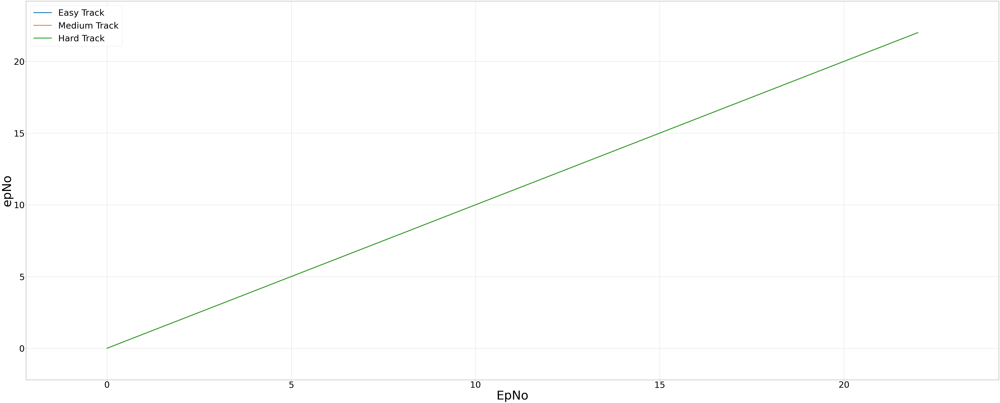

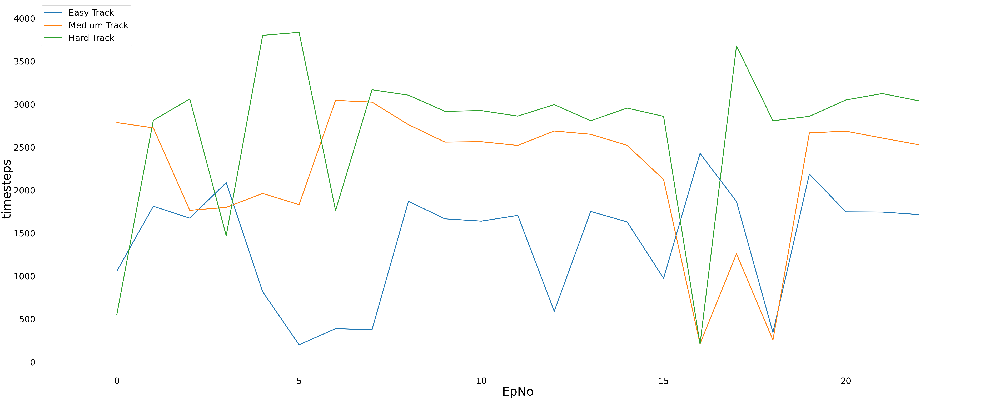

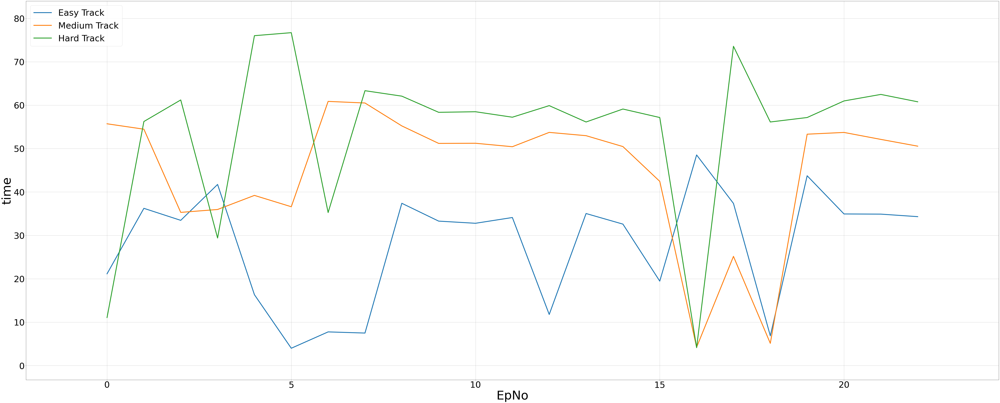

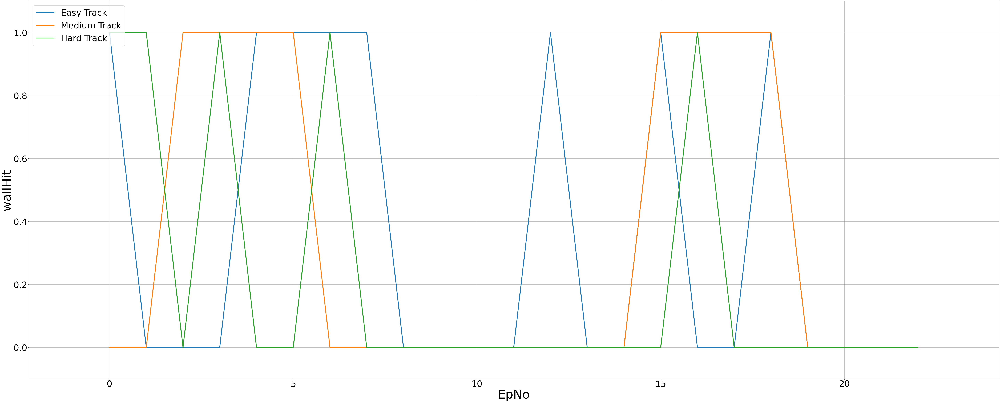

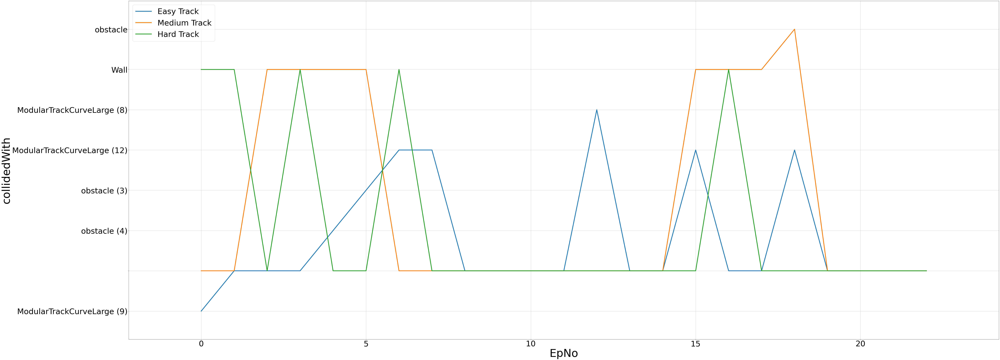

...

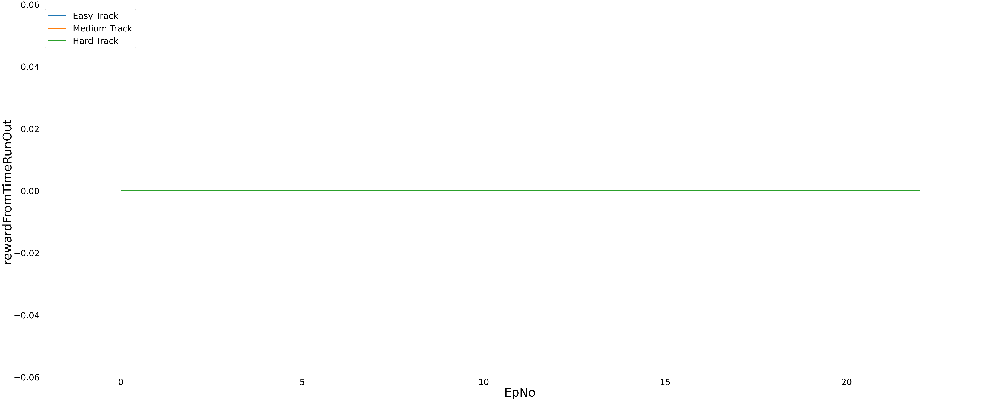

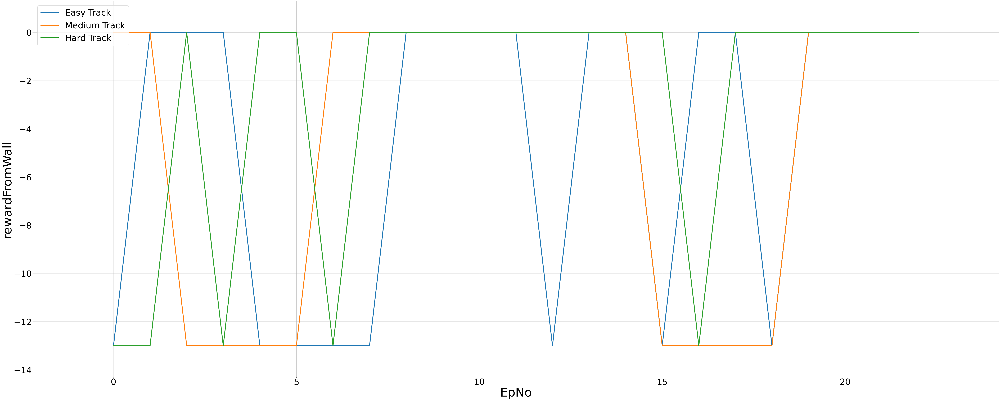

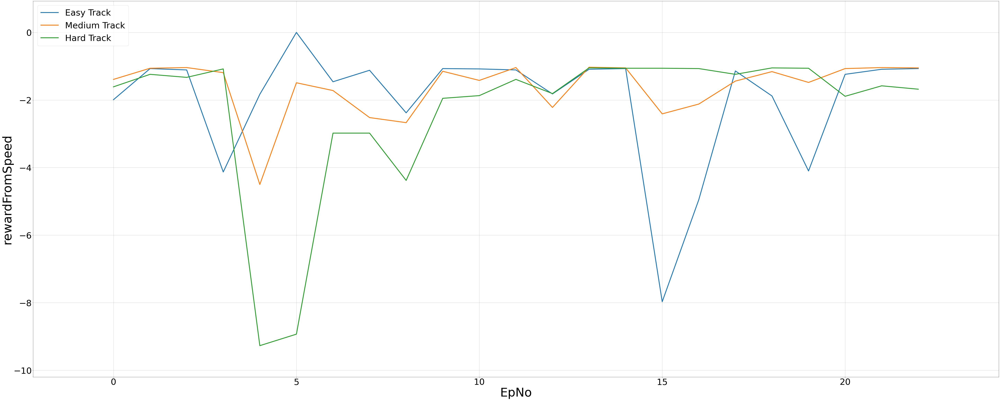

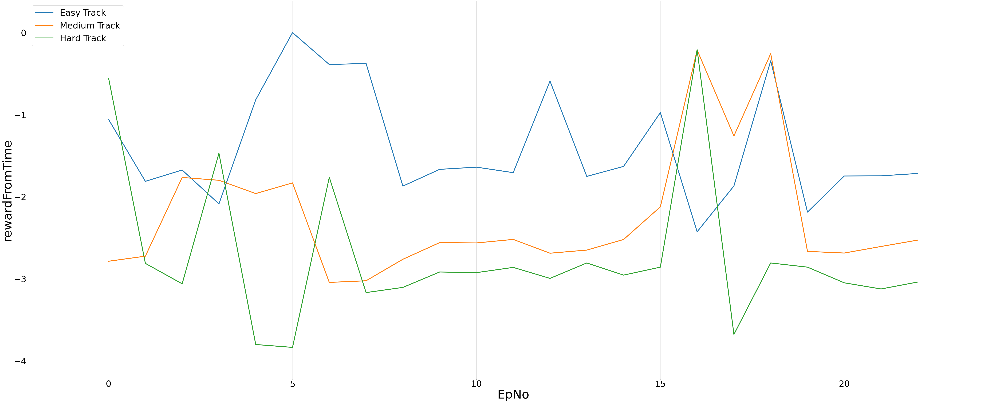

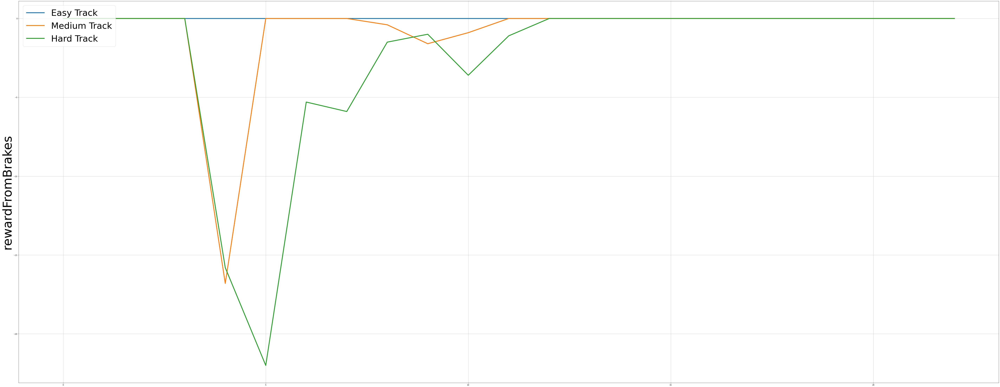

In [15]:
plt.rcParams["figure.figsize"] = (100,40)
plt.xticks(fontsize= 40)
plt.yticks(fontsize= 40)

#data = data.drop(columns=["collidedWith"])
#data.head()

for i,j in enumerate(dataHard):
    plt.xticks(fontsize= 40)
    plt.yticks(fontsize= 40)

    plt.xlabel("EpNo", fontsize= 70)
    plt.rcParams["figure.figsize"] = (100,40)
    plt.xticks(fontsize= 50)
    plt.yticks(fontsize= 50)
    plt.margins(x = 0.1, y = 0.1)
    plt.figure(i)
    plt.ylabel(j, fontsize= 70)

    plt.plot(dataEasy['epNo'], dataEasy[j], linewidth =5)
    plt.plot(dataMid['epNo'], dataMid[j], linewidth =5)
    plt.plot(dataHard['epNo'], dataHard[j], linewidth =5)

    plt.legend(["Easy Track", "Medium Track", "Hard Track"], prop={"size":50}, loc = 2)
    plt.grid(True)

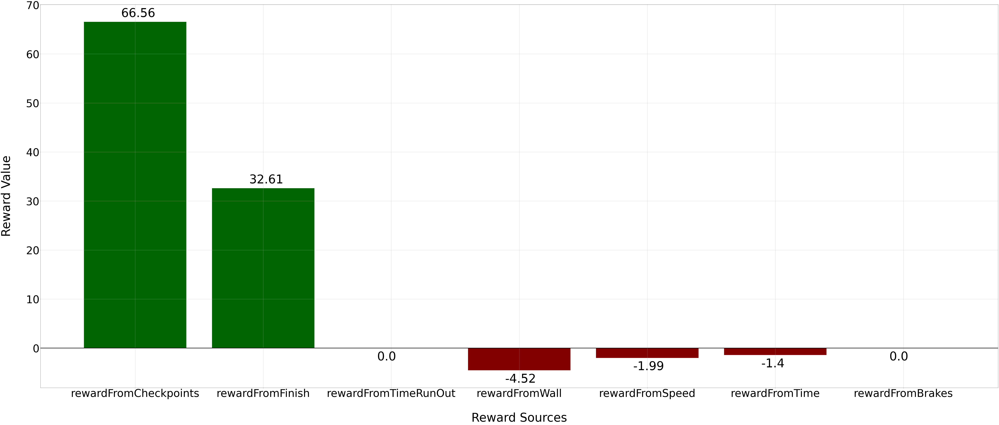

[66.56, 32.61, 0.0, -4.52, -1.99, -1.4, 0.0]


In [16]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
plt.rcParams["figure.figsize"] = (120,40)

rewardSources = ['rewardFromCheckpoints', 'rewardFromFinish', "rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
avgrewards = []
plt.xticks(fontsize= 80)
plt.yticks(fontsize= 80)
plt.ylabel("Reward Value", fontsize = 90, labelpad= 100)
plt.xlabel("Reward Sources", fontsize = 90, labelpad= 100)


for i in rewardSources:
    avgrewards.append(dataEasy[i].mean())

avgrewards = [round(num, 2) for num in avgrewards]

ax.bar(rewardSources, avgrewards, color = ["darkgreen", "darkgreen", "maroon", "maroon", "maroon", "maroon", "maroon"])

valLoc = []
for i in avgrewards:
    if i > 0:
        valLoc.append(i + 1)
    else:
         valLoc.append(i - 2.5)

for index, value in enumerate(avgrewards):
    plt.text(index-0.11, valLoc[index], str(value), size = 90)


ax.axhline(y=0, color='k', linestyle='-', linewidth = 4)
plt.grid()
plt.show()
print(avgrewards)

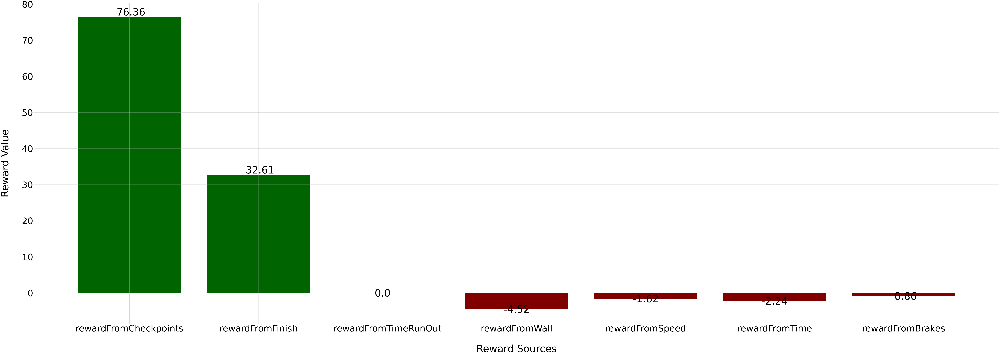

In [17]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
plt.rcParams["figure.figsize"] = (100,40)

rewardSources = ['rewardFromCheckpoints', 'rewardFromFinish', "rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
avgrewards = []
plt.xticks(fontsize= 80)
plt.yticks(fontsize= 80)
plt.ylabel("Reward Value", fontsize = 90, labelpad= 100)
plt.xlabel("Reward Sources", fontsize = 90, labelpad= 100)


for i in rewardSources:
    avgrewards.append(dataMid[i].mean())

avgrewards = [round(num, 2) for num in avgrewards]

ax.bar(rewardSources, avgrewards, color = ["darkgreen", "darkgreen", "maroon", "maroon", "maroon", "maroon", "maroon"])

valLoc = []
for i in avgrewards:
    if i > 0:
        valLoc.append(i + 0.5)
    else:
         valLoc.append(i - 1)

for index, value in enumerate(avgrewards):
    plt.text(index-0.1, valLoc[index], str(value), size = 90)


ax.axhline(y=0, color='k', linestyle='-', linewidth = 4)
plt.grid()
plt.show()

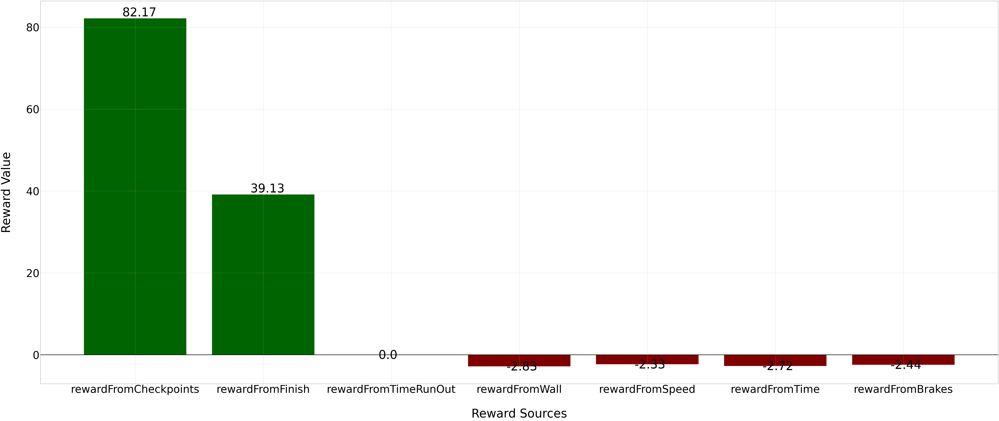

In [18]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
plt.rcParams["figure.figsize"] = (100,40)

rewardSources = ['rewardFromCheckpoints', 'rewardFromFinish', "rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
avgrewards = []
plt.xticks(fontsize= 80)
plt.yticks(fontsize= 80)
plt.ylabel("Reward Value", fontsize = 90, labelpad= 100)
plt.xlabel("Reward Sources", fontsize = 90, labelpad= 100)


for i in rewardSources:
    avgrewards.append(dataHard[i].mean())

avgrewards = [round(num, 2) for num in avgrewards]

ax.bar(rewardSources, avgrewards, color = ["darkgreen", "darkgreen", "maroon", "maroon", "maroon", "maroon", "maroon"])

valLoc = []
for i in avgrewards:
    if i > 0:
        valLoc.append(i + 0.5)
    else:
         valLoc.append(i - 1)

for index, value in enumerate(avgrewards):
    plt.text(index-0.1, valLoc[index], str(value), size = 90)


ax.axhline(y=0, color='k', linestyle='-', linewidth = 4)
plt.grid()
plt.show()

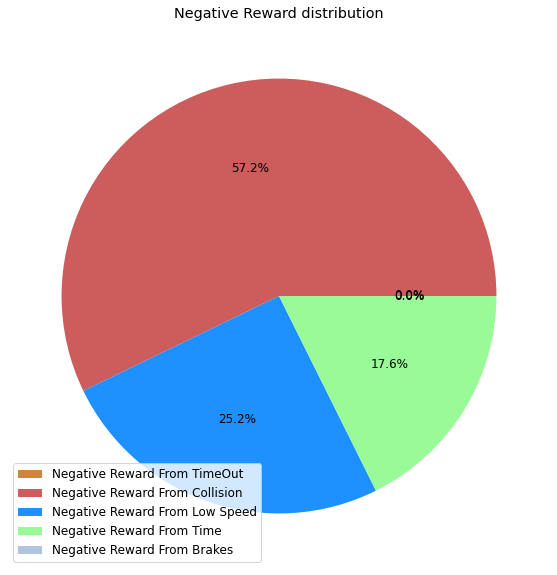

In [19]:
import matplotlib as mpl
mpl.rcParams['font.size'] = 12

negRewardSources = ["rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
negRewards = []
negRewardSourcesLabels = ["Negative Reward From TimeOut", "Negative Reward From Collision", "Negative Reward From Low Speed", "Negative Reward From Time", "Negative Reward From Brakes"]
plt.rcParams["figure.figsize"] = (10,10)
for i in negRewardSources:
    negRewards.append(abs(dataEasy[i].mean()))

distributionColors = ["peru", "indianred", "dodgerblue", "palegreen", "lightsteelblue"]

plt.title("Negative Reward distribution")
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 40)
pie, bla, pct=plt.pie(negRewards, autopct='%1.1f%%', colors=distributionColors)
plt.legend(negRewardSourcesLabels, loc = 3)


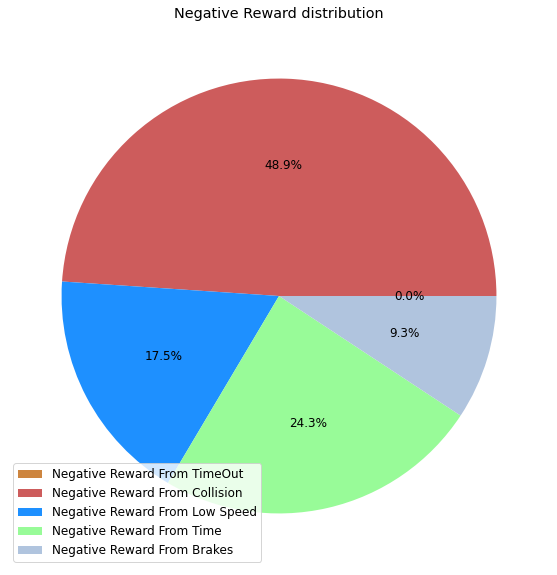

In [20]:
negRewardSources = ["rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
negRewards = []
negRewardSourcesLabels = ["Negative Reward From TimeOut", "Negative Reward From Collision", "Negative Reward From Low Speed", "Negative Reward From Time", "Negative Reward From Brakes"]

for i in negRewardSources:
    negRewards.append(abs(dataMid[i].mean()))

plt.title("Negative Reward distribution")
plt.rcParams["figure.figsize"] = (10,10)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 40)
plt.pie(negRewards, autopct='%1.1f%%', colors=distributionColors)
plt.legend(negRewardSourcesLabels, loc = 3)

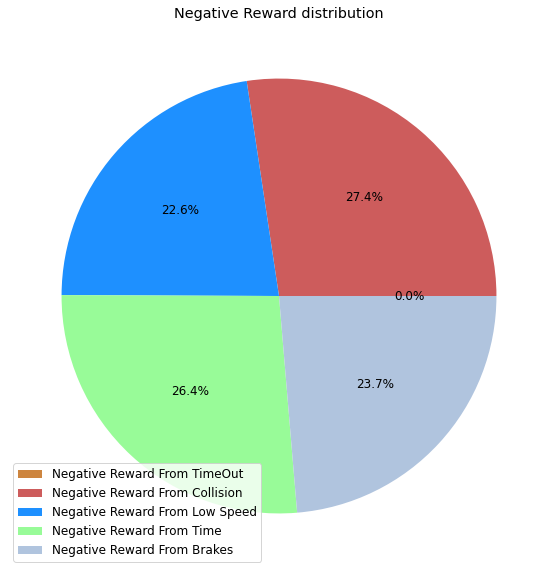

In [21]:
negRewardSources = ["rewardFromTimeRunOut", "rewardFromWall", "rewardFromSpeed", "rewardFromTime", "rewardFromBrakes"]
negRewards = []
negRewardSourcesLabels = ["Negative Reward From TimeOut", "Negative Reward From Collision", "Negative Reward From Low Speed", "Negative Reward From Time", "Negative Reward From Brakes"]

for i in negRewardSources:
    negRewards.append(abs(dataHard[i].mean()))

plt.title("Negative Reward distribution")
plt.rcParams["figure.figsize"] = (10,10)
plt.xticks(fontsize= 20)
plt.yticks(fontsize= 40)
plt.pie(negRewards, autopct='%1.1f%%', colors=distributionColors)
plt.legend(negRewardSourcesLabels, loc = 3)

8
14


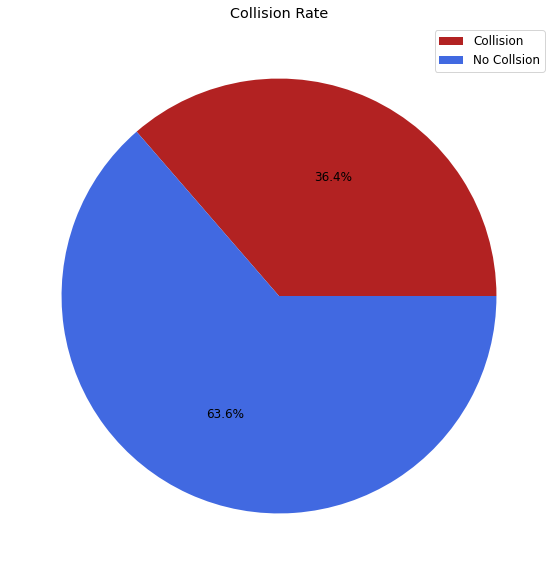

In [22]:
collsionRate = [dataEasy['wallHit'].sum(), (dataEasy['epNo'].iloc[-1]) - dataEasy['wallHit'].sum()]

collsionRateLabels = ["Collision", "No Collsion"]
plt.title("Collision Rate")
CollisionColors=["firebrick", "royalblue"]

plt.pie(collsionRate, autopct='%1.1f%%', colors=CollisionColors)

print(dataEasy['wallHit'].sum())
print((dataEasy['epNo'].iloc[-1]) - dataEasy['wallHit'].sum())
plt.legend(collsionRateLabels)

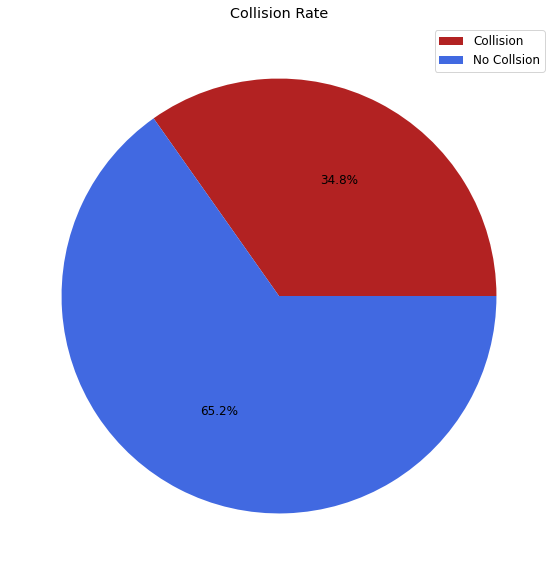

In [23]:
collsionRate = [dataMid['wallHit'].sum(), (dataMid['epNo'].iloc[-1] + 1) - dataMid['wallHit'].sum()]
collsionRateLabels = ["Collision", "No Collsion"]
plt.title("Collision Rate")
plt.pie(collsionRate, autopct='%1.1f%%', colors=CollisionColors)
plt.legend(collsionRateLabels)

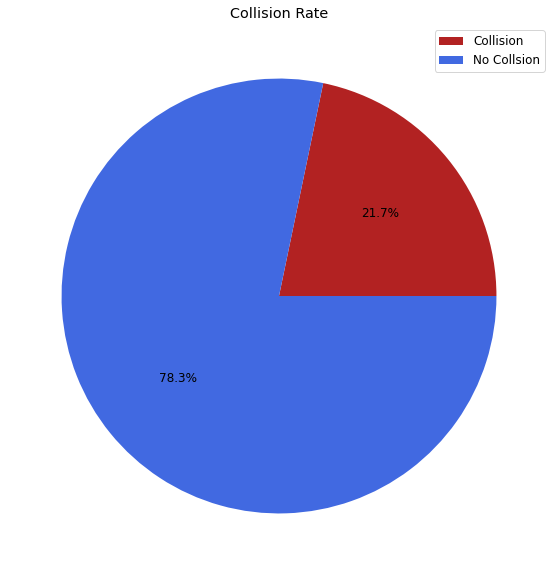

In [24]:
collsionRate = [dataHard['wallHit'].sum(), (dataHard['epNo'].iloc[-1] + 1) - dataHard['wallHit'].sum()]
collsionRateLabels = ["Collision", "No Collsion"]
plt.title("Collision Rate")
plt.pie(collsionRate, autopct='%1.1f%%', colors=CollisionColors)
plt.legend(collsionRateLabels)

In [25]:
print(f"Easy Track averageTime:   {dataEasy[dataEasy['rewardFromFinish'] == 50]['time'].mean()}")
print(f"Mid Track averageTime:    {dataMid[dataMid['rewardFromFinish'] == 50]['time'].mean()}")
print(f"Hard Track averageTime:   {dataHard[dataHard['rewardFromFinish'] == 50]['time'].mean()}")

Easy Track averageTime:   36.69857520666667
Mid Track averageTime:    53.769020706666666
Hard Track averageTime:   62.04532972777778


In [26]:
print(f"Easy Track averageTime:   {dataEasy[dataEasy['rewardFromFinish'] == 50]['avgSpeed'].mean()}")
print(f"Mid Track averageTime:    {dataMid[dataMid['rewardFromFinish'] == 50]['avgSpeed'].mean()}")
print(f"Hard Track averageTime:   {dataHard[dataHard['rewardFromFinish'] == 50]['avgSpeed'].mean()}")


Easy Track averageTime:   7.840473953458856
Mid Track averageTime:    7.65079030895893
Hard Track averageTime:   6.678031770714373


In [27]:
avgTimeR = [31.7, 47.1, 54.4]   
avgTimeH = [36.7, 53.8, 62.1]
d = {"Human": avgTimeH , "Model": avgTimeR, "Track":["Easy Track", "Mid Track", "Hard track"]}
avgTime  = pd.DataFrame(d)
avgTime = pd.melt(avgTime, id_vars="Track", value_name="Time", var_name= "Driver")
avgTime
# avgTime.set_index("Track")



,Track,Driver,Time
0,Easy Track,Human,36.7
1,Mid Track,Human,53.8
2,Hard track,Human,62.1
3,Easy Track,Model,31.7
4,Mid Track,Model,47.1
5,Hard track,Model,54.4


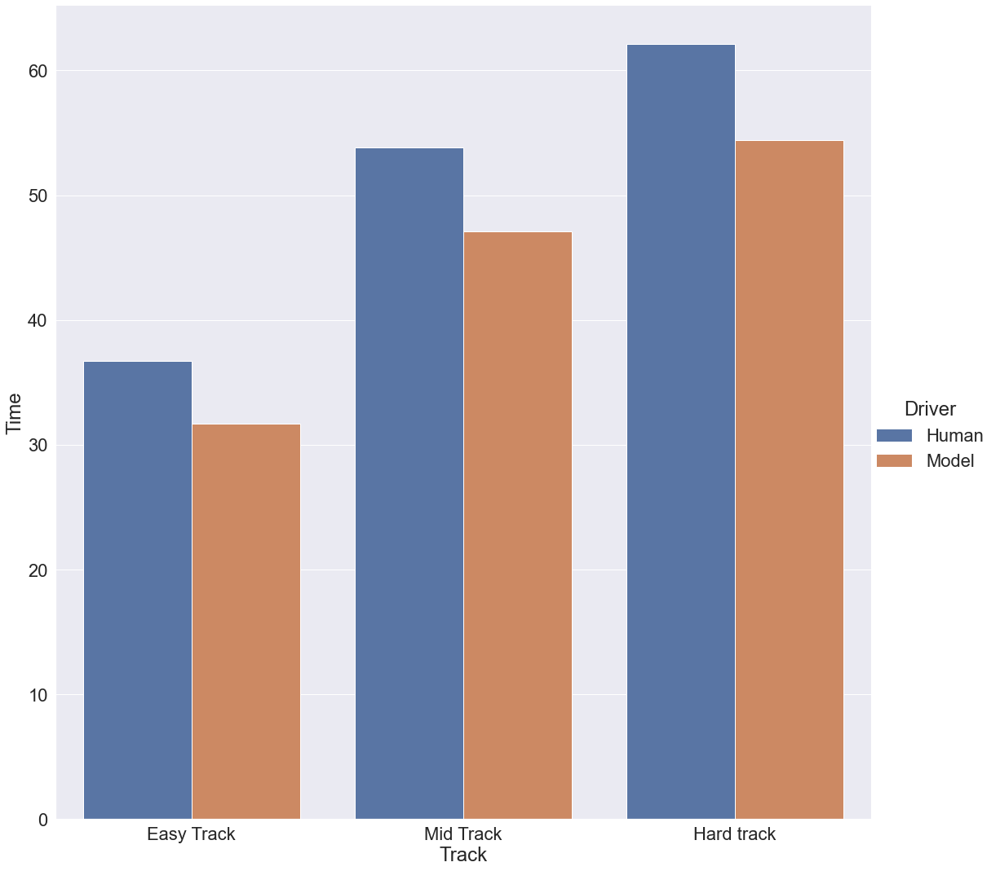

In [28]:
sns.set_theme()
sns.set(font_scale = 2)
ax = sns.catplot(x="Track", y="Time", data=avgTime, kind='bar', hue ="Driver", height=15)

#     data=avgTime, kind="bar", x = "Track"
# )
# g.despine(left=True)
# g.set_axis_labels("", "Body mass (g)")
# #g.legend.set_title("")

In [29]:


avgTimeR = [8.7, 8.2, 7.0]
avgTimeH = [dataEasy[dataEasy['rewardFromFinish'] == 50]['avgSpeed'].mean(), dataMid[dataMid['rewardFromFinish'] == 50]['avgSpeed'].mean(), dataHard[dataHard['rewardFromFinish'] == 50]['avgSpeed'].mean()]
d = {"Human": avgTimeH , "Model": avgTimeR, "Track":["Easy Track", "Mid Track", "Hard track"]}
avgTime  = pd.DataFrame(d)
avgTime = pd.melt(avgTime, id_vars="Track", value_name="Average Speed", var_name= "Driver")
avgTime
# avgTime.set_index("Track")


,Track,Driver,Average Speed
0,Easy Track,Human,7.840474
1,Mid Track,Human,7.650790
2,Hard track,Human,6.678032
3,Easy Track,Model,8.700000
4,Mid Track,Model,8.200000
5,Hard track,Model,7.000000


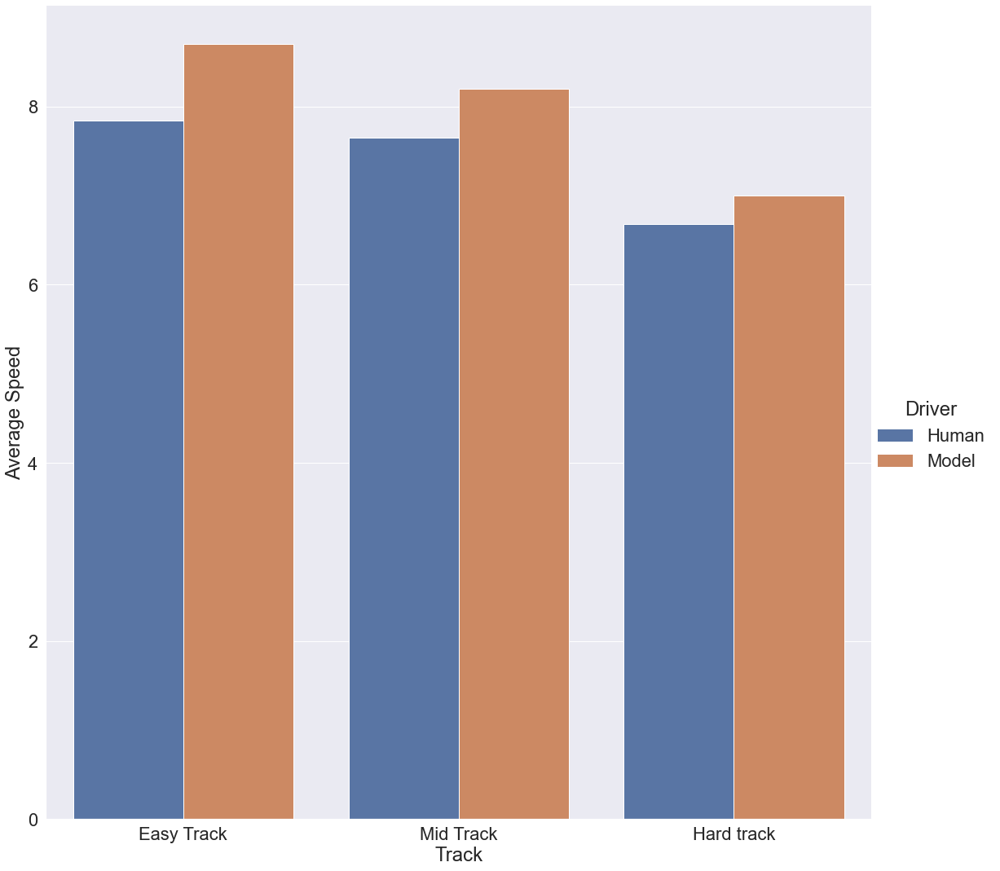

In [30]:
sns.set_theme()
sns.set(font_scale = 2)
ax = sns.catplot(x="Track", y="Average Speed", data=avgTime, kind='bar', hue ="Driver", height=15)

In [31]:
print(f"Easy Track average reward:   {dataEasy['totalReward'].mean()} ")
print(f"Mid Track average reward:    {dataMid['totalReward'].mean()} ")
print(f"Hard Track average reward:   {dataHard['totalReward'].mean()} ")

Easy Track average reward:   91.24803033043477 
Mid Track average reward:    99.72756564347826 
Hard Track average reward:   110.98115253913042 


In [34]:
avgRewardR = [139.8, 140.4, 134.7]
avgRewardH = [dataEasy['totalReward'].mean(), dataMid['totalReward'].mean(), dataHard['totalReward'].mean()]
d = {"Human": avgRewardH , "Model": avgRewardR, "Track":["Easy Track", "Mid Track", "Hard track"]}
avgReward  = pd.DataFrame(d)
avgReward = pd.melt(avgReward, id_vars="Track", value_name="Average Reward Total", var_name= "Driver")
avgReward

# avgTime.set_index("Track")

,Track,Driver,Average Reward Total
0,Easy Track,Human,91.248030
1,Mid Track,Human,99.727566
2,Hard track,Human,110.981153
3,Easy Track,Model,139.800000
4,Mid Track,Model,140.400000
5,Hard track,Model,134.700000


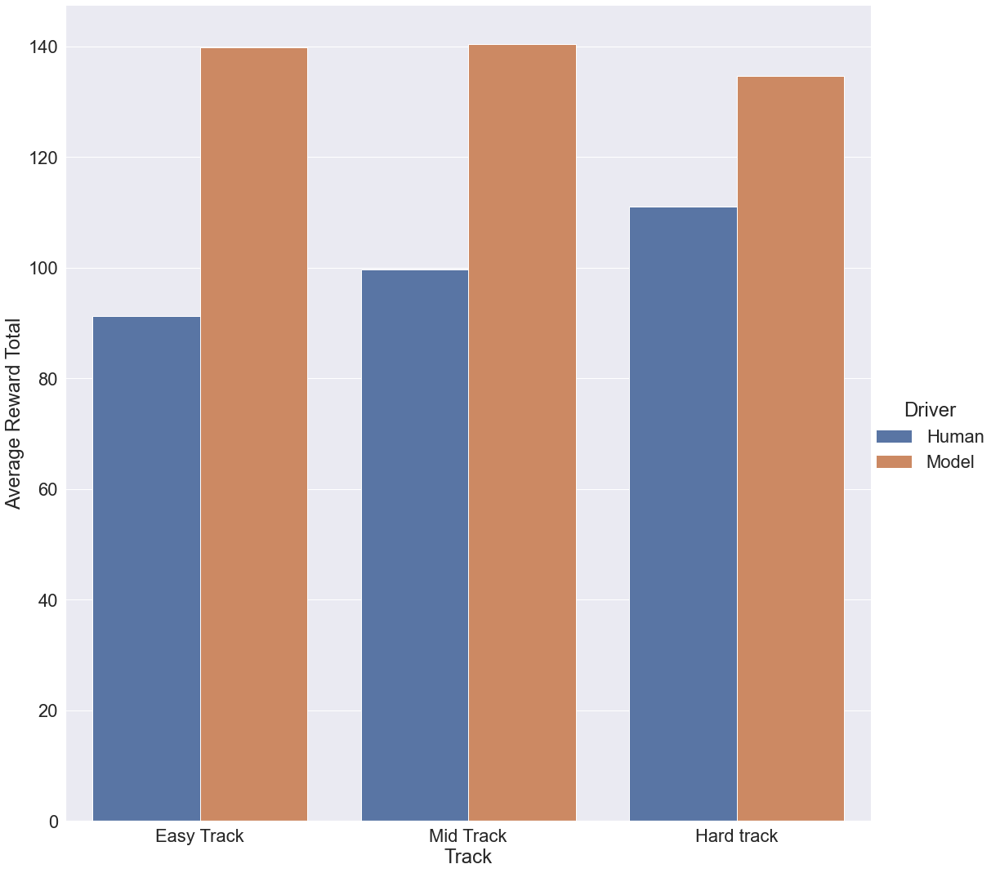

In [35]:
sns.set_theme()
sns.set(font_scale = 2)
ax = sns.catplot(x="Track", y="Average Reward Total", data=avgReward, kind='bar', hue ="Driver", height=15)